# 6.4 - Supervised Machine Learning: Regression

### Contents list:
1. Import libraries and data
2. Data cleaning
3. Data prep for regression analysis
4. Regression analysis
5. Bonus: Performance improvement after removing outliers

### 1. Import libraries and data

In [1]:
# import libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import os
import sklearn
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [2]:
# declare path as variable

path = r'/Users/dekstrom/Documents/CareerFoundry/Achievement 6'

In [3]:
# import WDI_CLEANED_2.csv as main dataframe

df = pd.read_csv(os.path.join(path,'01 Data','Prepared Data','WDI_CLEANED_2.csv'), index_col = False)

### 2. Data cleaning

In [4]:
# check shape

df.shape

(13888, 55)

In [5]:
# check head

df.head()

,Country Name,Country Code,Year,Income Grouping,Top religion,National income,Agricultural land %,Alternative & nuclear energy use %,Armed forces personnel %,Avg child working hours,...,Military expenditure %,Infant mortality rate,Population growth,Population,Renewable electricity output %,Renewable energy consumption %,Suicide mortality rate,Alcohol consumption per capita,Urban population %,Wanted fertility rate
0,Afghanistan,AFG,1960,NaN,Islam,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,8622466.0,NaN,NaN,NaN,NaN,8.401,NaN
1,Afghanistan,AFG,1961,NaN,Islam,NaN,57.878356,NaN,NaN,NaN,...,NaN,NaN,1.925952,8790140.0,NaN,NaN,NaN,NaN,8.684,NaN
2,Afghanistan,AFG,1962,NaN,Islam,NaN,57.955016,NaN,NaN,NaN,...,NaN,NaN,2.014879,8969047.0,NaN,NaN,NaN,NaN,8.976,NaN
3,Afghanistan,AFG,1963,NaN,Islam,NaN,58.031676,NaN,NaN,NaN,...,NaN,228.9,2.078997,9157465.0,NaN,NaN,NaN,NaN,9.276,NaN
4,Afghanistan,AFG,1964,NaN,Islam,NaN,58.116002,NaN,NaN,NaN,...,NaN,225.1,2.139651,9355514.0,NaN,NaN,NaN,NaN,9.586,NaN


In [6]:
# check which variables have enough data points

new_cols = [] # create empty list for new columns

for col in df.columns.tolist():
    if (df[col].notnull().sum() > 5000) or (col == 'Top religion'):
        new_cols.append(col)

print(new_cols)
df_small = df[new_cols]

['Country Name', 'Country Code', 'Year', 'Income Grouping', 'Top religion', 'National income', 'Agricultural land %', 'Alternative & nuclear energy use %', 'Birth rate', 'CO2 emissions', 'Death rate', 'Electricity prod - coal %', 'Electricity prod - hydroelectric %', 'Electricity prod - natural gas %', 'Electricity prod - nuclear %', 'Electricity prod - oil %', 'Electricity prod - oil, gas & coal %', 'Electricity prod - renewables %', 'GDP', 'GDP growth %', 'GDP per capita', 'GNI', 'GNI per capita', 'Internet users %', 'Land area', 'Life expectancy at birth', 'Military expenditure %', 'Infant mortality rate', 'Population growth', 'Population', 'Renewable electricity output %', 'Renewable energy consumption %', 'Urban population %']


In [7]:
# check output

df_small.shape

(13888, 33)

In [18]:
# export df_small

df_small.to_csv(os.path.join(path, '01 Data','Prepared Data','df_reduced_columns.csv'), index=False)

In [8]:
# define categorical columns for df_small and df with cat cols

cat_cols = ['National income', 'Agricultural land %', 'Alternative & nuclear energy use %', 'Birth rate', 'CO2 emissions', 'Death rate', 'Electricity prod - coal %', 'Electricity prod - hydroelectric %', 'Electricity prod - natural gas %', 'Electricity prod - nuclear %', 'Electricity prod - oil %', 'Electricity prod - oil, gas & coal %', 'Electricity prod - renewables %', 'GDP', 'GDP growth %', 'GDP per capita', 'GNI', 'GNI per capita', 'Internet users %', 'Land area', 'Life expectancy at birth', 'Military expenditure %', 'Infant mortality rate', 'Population growth', 'Population', 'Renewable electricity output %', 'Renewable energy consumption %', 'Urban population %']
df_cat = df_small[cat_cols]

In [9]:
# check shape

df_cat.shape

(13888, 28)

In [10]:
# check head

df_cat.head()

,National income,Agricultural land %,Alternative & nuclear energy use %,Birth rate,CO2 emissions,Death rate,Electricity prod - coal %,Electricity prod - hydroelectric %,Electricity prod - natural gas %,Electricity prod - nuclear %,...,Internet users %,Land area,Life expectancy at birth,Military expenditure %,Infant mortality rate,Population growth,Population,Renewable electricity output %,Renewable energy consumption %,Urban population %
0,NaN,NaN,NaN,50.340,NaN,31.921,NaN,NaN,NaN,NaN,...,NaN,NaN,32.535,NaN,NaN,NaN,8622466.0,NaN,NaN,8.401
1,NaN,57.878356,NaN,50.443,NaN,31.349,NaN,NaN,NaN,NaN,...,NaN,652230.0,33.068,NaN,NaN,1.925952,8790140.0,NaN,NaN,8.684
2,NaN,57.955016,NaN,50.570,NaN,30.845,NaN,NaN,NaN,NaN,...,NaN,652230.0,33.547,NaN,NaN,2.014879,8969047.0,NaN,NaN,8.976
3,NaN,58.031676,NaN,50.703,NaN,30.359,NaN,NaN,NaN,NaN,...,NaN,652230.0,34.016,NaN,228.9,2.078997,9157465.0,NaN,NaN,9.276
4,NaN,58.116002,NaN,50.831,NaN,29.867,NaN,NaN,NaN,NaN,...,NaN,652230.0,34.494,NaN,225.1,2.139651,9355514.0,NaN,NaN,9.586


In [11]:
# create correlation matrix from df_cat

df_cat.corr()

,National income,Agricultural land %,Alternative & nuclear energy use %,Birth rate,CO2 emissions,Death rate,Electricity prod - coal %,Electricity prod - hydroelectric %,Electricity prod - natural gas %,Electricity prod - nuclear %,...,Internet users %,Land area,Life expectancy at birth,Military expenditure %,Infant mortality rate,Population growth,Population,Renewable electricity output %,Renewable energy consumption %,Urban population %
National income,1.000000,0.045465,0.133824,-0.215042,0.791586,-0.042222,0.199557,-0.134853,0.003975,0.225815,...,0.227960,0.406025,0.214899,-0.001905,-0.173906,-0.119678,0.374306,-0.097279,-0.161646,0.189912
Agricultural land %,0.045465,1.000000,-0.115671,-0.003584,0.062716,0.137189,0.336730,-0.158073,-0.130819,0.052158,...,-0.125850,0.005875,-0.066376,-0.076290,0.050553,-0.112036,0.113415,0.012586,0.119901,-0.153997
Alternative & nuclear energy use %,0.133824,-0.115671,1.000000,-0.313727,0.017167,-0.009269,-0.120641,0.377319,-0.230068,0.574348,...,0.296868,-0.012209,0.313539,-0.145063,-0.295132,-0.264429,-0.060052,0.333093,0.001454,0.225585
Birth rate,-0.215042,-0.003584,-0.313727,1.000000,-0.172282,0.552742,-0.340051,0.303681,-0.106648,-0.368280,...,-0.574729,-0.052395,-0.873164,0.127912,0.846472,0.528985,-0.070188,0.232352,0.685791,-0.643719
CO2 emissions,0.791586,0.062716,0.017167,-0.172282,1.000000,-0.032978,0.277007,-0.132227,-0.023015,0.107561,...,0.112575,0.593374,0.147095,0.020727,-0.129096,-0.077807,0.713524,-0.095455,-0.141487,0.107419
Death rate,-0.042222,0.137189,-0.009269,0.552742,-0.032978,1.000000,0.039428,0.244128,-0.292307,0.084388,...,-0.174349,0.009173,-0.809256,-0.058266,0.770162,0.024023,-0.042123,0.202499,0.452930,-0.521038
Electricity prod - coal %,0.199557,0.336730,-0.120641,-0.340051,0.277007,0.039428,1.000000,-0.351998,-0.214563,0.080100,...,0.082152,0.201684,0.194038,-0.060774,-0.229022,-0.263484,0.251049,-0.335095,-0.258344,0.116187
Electricity prod - hydroelectric %,-0.134853,-0.158073,0.377319,0.303681,-0.132227,0.244128,-0.351998,1.000000,-0.377569,-0.170535,...,-0.170176,0.029608,-0.317687,-0.125040,0.307793,0.052630,-0.063985,0.983620,0.653000,-0.323071
Electricity prod - natural gas %,0.003975,-0.130819,-0.230068,-0.106648,-0.023015,-0.292307,-0.214563,-0.377569,1.000000,-0.082131,...,0.128217,-0.029929,0.163276,0.051432,-0.152626,0.184342,-0.034459,-0.417703,-0.375272,0.185191
Electricity prod - nuclear %,0.225815,0.052158,0.574348,-0.368280,0.107561,0.084388,0.080100,-0.170535,-0.082131,1.000000,...,0.228024,0.021745,0.285369,-0.097400,-0.289694,-0.285473,0.005475,-0.184052,-0.237599,0.241072


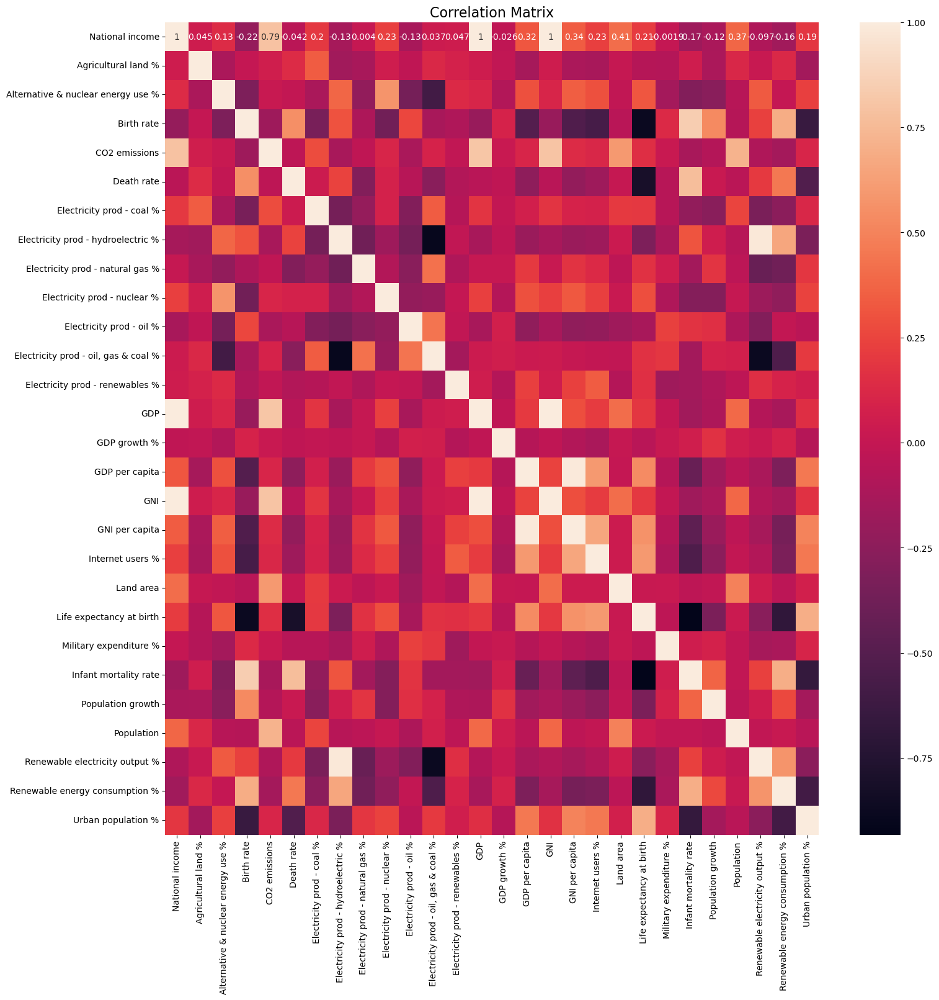

In [12]:
# create heatmap with seaborn

f,ax = plt.subplots(figsize=(17,17))
corr = sns.heatmap(df_cat.corr(), annot = True, ax = ax)
ax.set_title('Correlation Matrix', fontsize = 16)
f.savefig("/Users/dekstrom/Documents/CareerFoundry/Achievement 6/04 Visualizations/corr_heatmap_small.png") # save figure

In [13]:
# hide future warnings

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

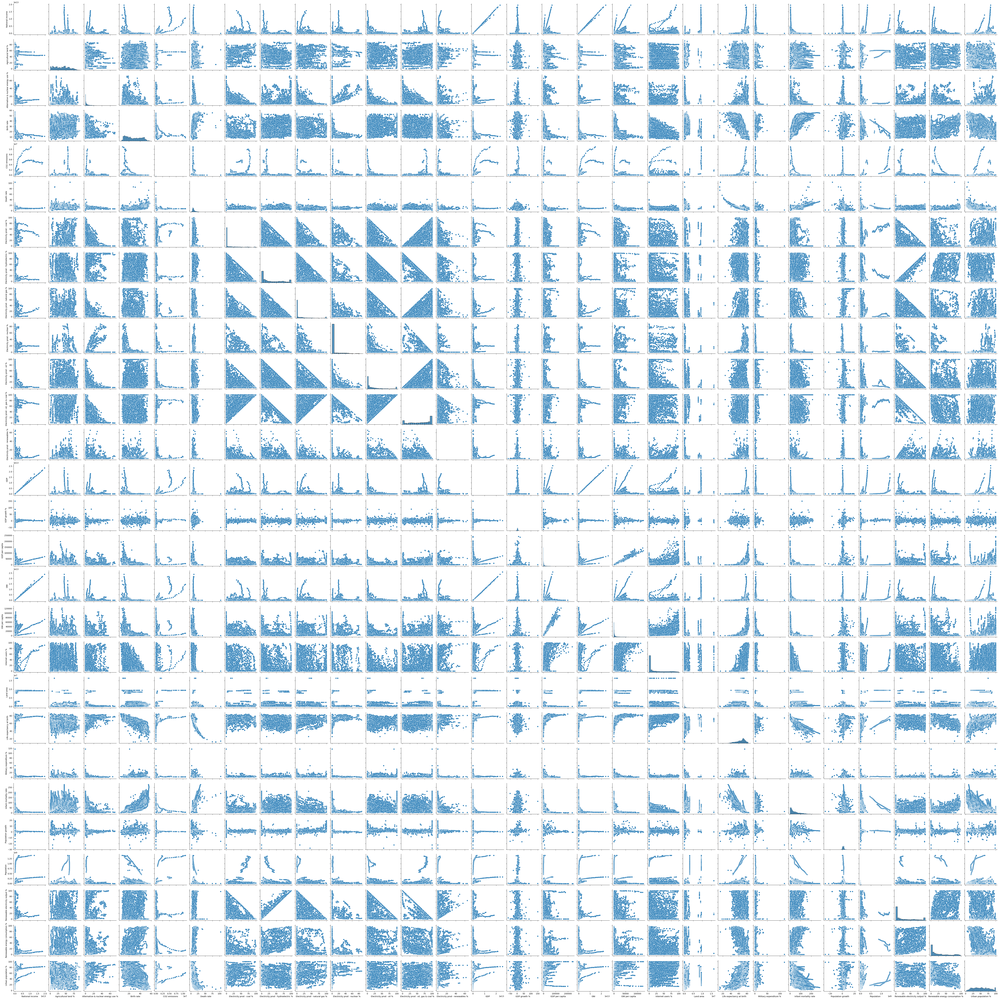

In [14]:
# create a pair plot from df_cat 

pairplot = sns.pairplot(df_cat)

In [15]:
# save pair plot

pairplot.savefig("/Users/dekstrom/Documents/CareerFoundry/Achievement 6/04 Visualizations/pair_plot_small.png")

### 3. Data prep for regression analysis

#### Regression 1: Birth rate vs Infant mortality rate

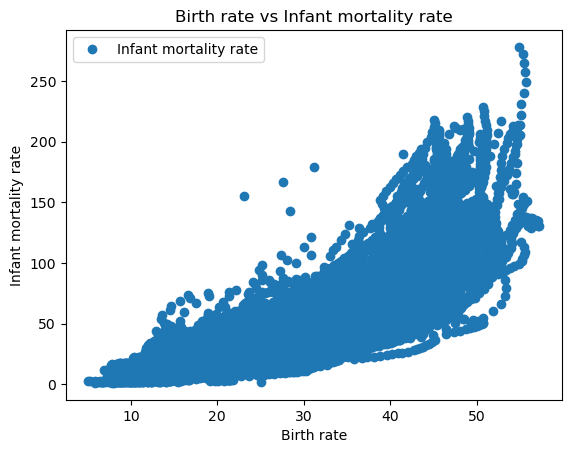

In [16]:
# create a scatterplot for regression variables

df_small.plot(x = 'Birth rate', y='Infant mortality rate',style='o')
plt.title('Birth rate vs Infant mortality rate')  
plt.xlabel('Birth rate')  
plt.ylabel('Infant mortality rate')  
plt.show()

### Hypothesis 1:

#### If a country in a given year has a high birth rate, it is more likely to have a higher infant mortality rate.

In [17]:
# clean df of nulls

df_clean = df_small.dropna(subset=['Birth rate', 'Infant mortality rate'])

In [18]:
# reshape variables into numpy arrays and put them into separate objects

X_brth_infmort = df_clean['Birth rate'].values.reshape(-1,1)
y_brth_infmort = df_clean['Infant mortality rate'].values.reshape(-1,1)

In [19]:
# split data into a training and test set

X_brth_infmort_train, X_brth_infmort_test, y_brth_infmort_train, y_brth_infmort_test = train_test_split(X_brth_infmort, y_brth_infmort, test_size=0.3, random_state=0)

#### Regression 2: Life expectancy at birth vs Renewable energy consumption %

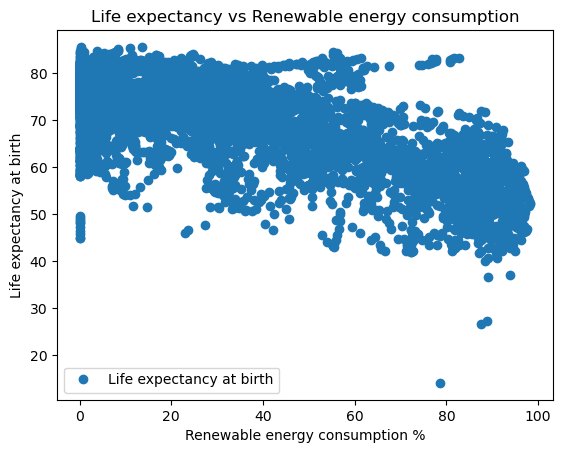

In [98]:
# create a scatterplot for regression variables

df_small.plot(x = 'Renewable energy consumption %', y = 'Life expectancy at birth',style='o')
plt.title('Life expectancy vs Renewable energy consumption')  
plt.xlabel('Renewable energy consumption %')  
plt.ylabel('Life expectancy at birth')
plt.show()

### Hypothesis 2:

#### If a country in a given year has a high renewable energy consumption percentage, it is more likely to have a lower life expectancy at birth.

In [99]:
# clean df of nulls

df_clean2 = df_small.dropna(subset=['Life expectancy at birth','Renewable energy consumption %'])

In [100]:
# reshape variables into numpy arrays and put them into separate objects

X2 = df_clean2['Renewable energy consumption %'].values.reshape(-1,1)
y2 = df_clean2['Life expectancy at birth'].values.reshape(-1,1)

In [101]:
# split data into a training and test set

X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.3, random_state=0)

### 4. Regression analysis

#### Regression 1: Birth rate vs Infant mortality rate

In [67]:
# create a regression object

regression = LinearRegression()

In [68]:
# fit the regression object onto the training set

regression.fit(X_brth_infmort_train, y_brth_infmort_train)

LinearRegression()

In [69]:
# Predict the values of y using X.

y_brth_infmort_pred = regression.predict(X_brth_infmort_test)

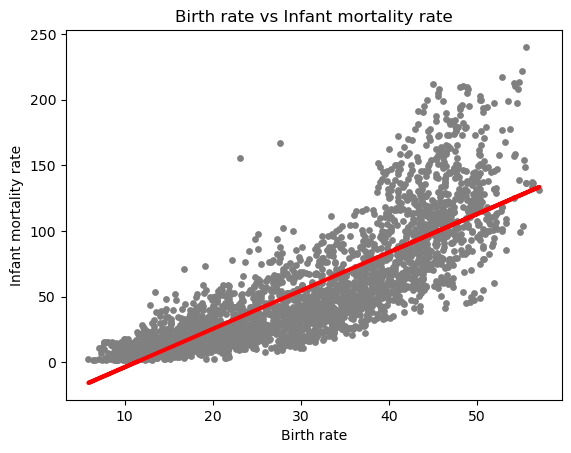

In [105]:
# Create a plot that shows the regression line from the model on the test set.

plot_test = plt
plot_test.scatter(X_brth_infmort_test, y_brth_infmort_test, color='gray', s = 15)
plot_test.plot(X_brth_infmort_test, y_brth_infmort_pred, color='red', linewidth =3)
plot_test.title('Birth rate vs Infant mortality rate')
plot_test.xlabel('Birth rate')
plot_test.ylabel('Infant mortality rate')
plot_test.show()

#### Discussion for Regression 1:
The line appears to fit the data decently well for a larger portion of the data. Specifically, when birth rates are under 40 and infant mortality rate is under ~120, the variables appear to have a linear relationship. However, above that relaionship changes at higher rates. Therefore, the overall regression fit is partially accurate for some of the data but skewed because its trying to fit a linear trend onto a not entirely linear relationship.

In [106]:
# create objects that contain the model summary statistics.

rmse = mean_squared_error(y_brth_infmort_test, y_brth_infmort_pred)
r2 = r2_score(y_brth_infmort_test, y_brth_infmort_pred)

In [107]:
# print the model summary statistics to evaluate performance of the model

print('Slope:' ,regression.coef_)
print('Mean squared error: ', rmse)
print('R2 score: ', r2)

Slope: [[2.91533096]]
Mean squared error:  583.5359811352289
R2 score:  0.7154284945381109


In [108]:
# show y predicted

y_brth_infmort_pred

array([[85.90333832],
       [87.08696269],
       [-1.44580788],
       ...,
       [35.3427535 ],
       [-8.1335771 ],
       [ 0.45207258]])

In [109]:
# create a dataframe comparing the actual and predicted values of y.

data = pd.DataFrame({'Actual': y_brth_infmort_test.flatten(), 'Predicted': y_brth_infmort_pred.flatten()})
data.head(30)

,Actual,Predicted
0,117.6,85.903338
1,50.2,87.086963
2,2.3,-1.445808
3,47.0,74.381950
4,27.3,69.093540
5,4.8,-3.469048
6,150.6,99.955234
7,8.1,3.819280
8,102.2,101.891013
9,83.3,87.707928


##### Compare how the regression fits the training set

In [111]:
# predict

y_predicted_train = regression.predict(X_brth_infmort_train)

In [113]:
rmse = mean_squared_error(y_brth_infmort_train, y_predicted_train)
r2 = r2_score(y_brth_infmort_train, y_predicted_train)

In [114]:
print('Slope:' ,regression.coef_)
print('Mean squared error: ', rmse)
print('R2 score: ', r2)

Slope: [[2.91533096]]
Mean squared error:  574.9040776217282
R2 score:  0.7169373222914799


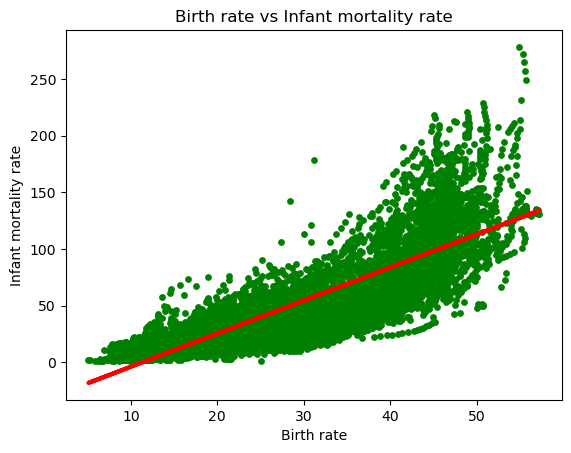

In [115]:
# visualizing the training set results

plot_test = plt
plot_test.scatter(X_brth_infmort_train, y_brth_infmort_train, color='green', s = 15)
plot_test.plot(X_brth_infmort_train, y_predicted_train, color='red', linewidth =3)
plot_test.title('Birth rate vs Infant mortality rate')
plot_test.xlabel('Birth rate')
plot_test.ylabel('Infant mortality rate')
plot_test.show()

#### Discussion for Regression 1:
The slope shows a positive relationship but the rmse is higher meaning the doesn't fit closely to the data points. The R2 however is pretty high meaning the variance in the data is pretty well explained by the model and we know we haven't overfit our model.

#### Regression 2: Life expectancy at birth vs Renewable energy consumption %

In [102]:
# create a regression object

regression2 = LinearRegression()

In [103]:
# fit the regression object onto the training set

regression2.fit(X2_train, y2_train)

LinearRegression()

In [104]:
# predict the values of y using X

y2_pred = regression2.predict(X2_test)

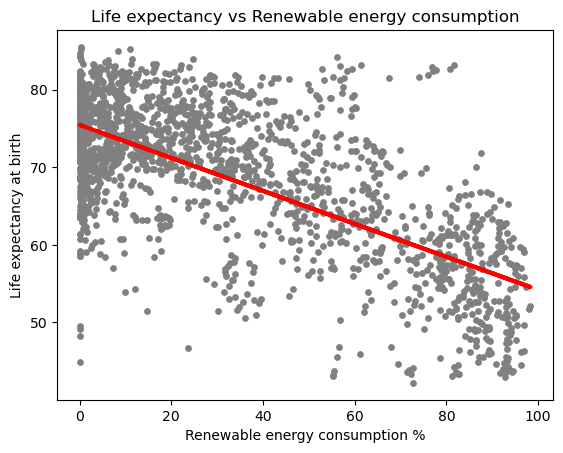

In [105]:
# create a plot that shows the regression line from the model on the test set

plot_test = plt
plot_test.scatter(X2_test, y2_test, color='gray', s = 15)
plot_test.plot(X2_test, y2_pred, color='red', linewidth =3)
plot_test.title('Life expectancy vs Renewable energy consumption')
plot_test.xlabel('Renewable energy consumption %')
plot_test.ylabel('Life expectancy at birth')
plot_test.show()

In [106]:
# create objects that contain the model summary statistics.

rmse_2 = mean_squared_error(y2_test, y2_pred)
r2_2 = r2_score(y2_test, y2_pred)

#### Discussion for Regression 2:
The line appears to fit the data pretty well especially above ~10% renewable energy consumption. I think overall the relationship is pretty well described as a linear relationship.

In [107]:
# print the model summary statistics to evaluate performance of the model

print('Slope:' ,regression2.coef_)
print('Mean squared error: ', rmse_2)
print('R2 score: ', r2_2)

Slope: [[-0.21235406]]
Mean squared error:  46.95160673813642
R2 score:  0.4598970244301055


In [108]:
# show y predicted

y2_pred

array([[74.53584108],
       [56.51122842],
       [72.39318861],
       ...,
       [64.27489288],
       [74.48912319],
       [75.32367465]])

In [109]:
# create a dataframe comparing the actual and predicted values of y

data = pd.DataFrame({'Actual': y2_test.flatten(), 'Predicted': y2_pred.flatten()})
data.head(30)

,Actual,Predicted
0,79.639024,74.535841
1,46.102000,56.511228
2,82.239024,72.393189
3,50.632000,67.776611
4,64.013000,65.833572
5,57.759000,68.309620
6,79.504000,75.408616
7,73.399000,68.383944
8,72.445000,72.752067
9,68.707317,67.804217


##### Compare how the regression fits the training set

In [110]:
# predict

y2_pred_train = regression2.predict(X2_train)

In [111]:
# refine r2 & rmse

rmse2 = mean_squared_error(y2_train, y2_pred_train)
r2_2 = r2_score(y2_train, y2_pred_train)

In [112]:
# print summary statistics

print('Slope:' ,regression2.coef_)
print('Mean squared error: ', rmse2)
print('R2 score: ', r2_2)

Slope: [[-0.21235406]]
Mean squared error:  45.95306107729184
R2 score:  0.4816895331776013


#### Discussion for Regression 2:
The slope shows a negative relationship and the rmse is relatively low meaning the model fits decently close to the data points. The R2 however is pretty low meaning the variance in the data is not explained well by the model. Overall this model is not a good explanation of the relationship. However, we can say that our model did not overfit the data.

### 5. Bonus: Performance improvement after removing outliers

#### Regression 1: Birth rate vs Infant mortality rate

In [132]:
# clean extreme values from df

df_trim = df_clean[df_clean['Infant mortality rate'] <= 230] 

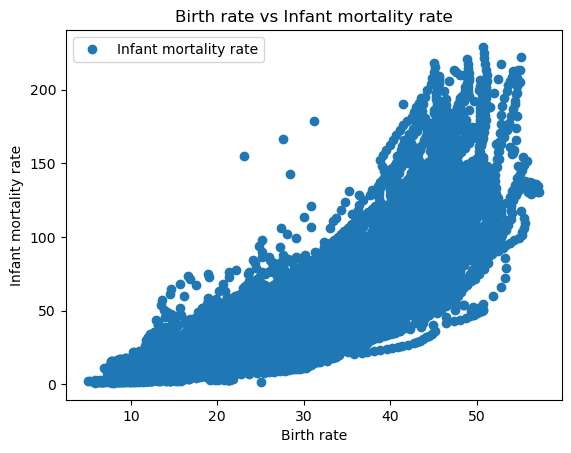

In [135]:
# create scatterplot from trimmed df

df_trim.plot(x = 'Birth rate', y='Infant mortality rate',style='o')
plt.title('Birth rate vs Infant mortality rate')  
plt.xlabel('Birth rate')  
plt.ylabel('Infant mortality rate')  
plt.show()

In [136]:
# reshape

Xt = df_trim['Birth rate'].values.reshape(-1,1)
yt = df_trim['Infant mortality rate'].values.reshape(-1,1)

In [137]:
# define test & train vars

Xt_train, Xt_test, yt_train, yt_test = train_test_split(Xt, yt, test_size=0.3, random_state=0)

In [138]:
# run and fit the regression

regression_t = LinearRegression()  
regression_t.fit(Xt_train, yt_train)

LinearRegression()

In [139]:
# predict

yt_pred = regression_t.predict(Xt_test)

In [140]:
# define r2 and rmse

rmse_t = mean_squared_error(yt_test, yt_pred)
r2_t = r2_score(yt_test, yt_pred)

In [141]:
# print stats

print('Slope:' ,regression_t.coef_)
print('Mean squared error: ', rmse_t)
print('R2 score: ', r2_t)

Slope: [[2.91308788]]
Mean squared error:  568.2594458728189
R2 score:  0.7143576405227957


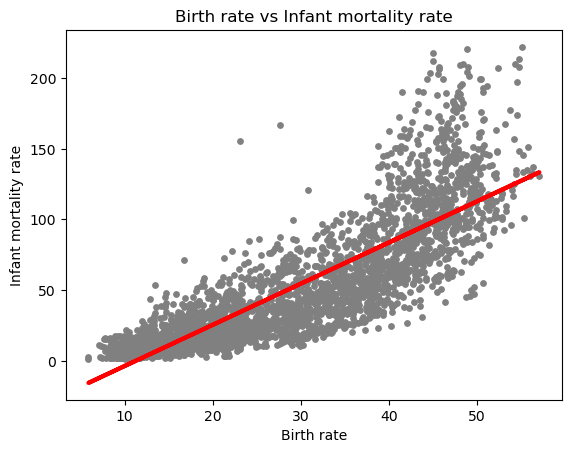

In [142]:
# visualizing the test set results

plot_test = plt
plot_test.scatter(Xt_test, yt_test, color='gray', s = 15)
plot_test.plot(Xt_test, yt_pred, color='red', linewidth =3)
plot_test.title('Birth rate vs Infant mortality rate')
plot_test.xlabel('Birth rate')
plot_test.ylabel('Infant mortality rate')
plot_test.show()

In [143]:
data = pd.DataFrame({'Actual': yt_test.flatten(), 'Predicted': yt_pred.flatten()})
data.head(30)

,Actual,Predicted
0,195.6,107.835104
1,114.1,84.306093
2,6.0,8.647374
3,14.6,36.243056
4,27.3,69.108513
5,30.5,52.562174
6,39.8,54.021631
7,8.1,3.884476
8,102.2,101.880752
9,83.3,87.708579


#### Discussion for Regression 1:
Removing outliers has not improved the model's fit significantly.

#### Regression 2: Life expectancy at birth vs Renewable energy consumption %

In [119]:
# clean extreme values from df

df_trim2 = df_clean2[df_clean2['Life expectancy at birth'] >= 40] 

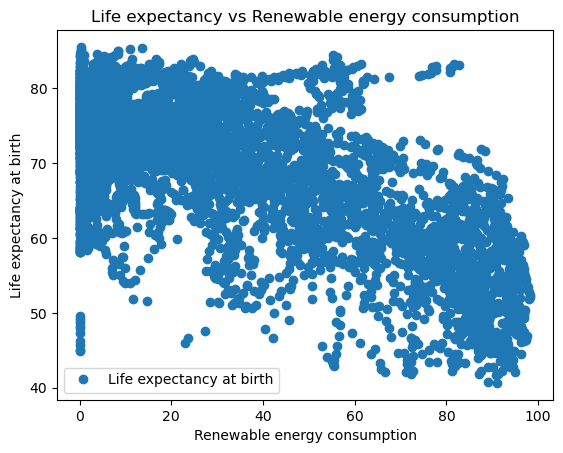

In [120]:
# create scatterplot from trimmed df

df_trim2.plot(x = 'Renewable energy consumption %', y = 'Life expectancy at birth', style='o')  
plt.title('Life expectancy vs Renewable energy consumption')  
plt.xlabel('Renewable energy consumption')  
plt.ylabel('Life expectancy at birth')
plt.show()

In [121]:
# reshape

X2t = df_trim2['Renewable energy consumption %'].values.reshape(-1,1)
y2t = df_trim2['Life expectancy at birth'].values.reshape(-1,1)

In [122]:
# define test & train vars

X2t_train, X2t_test, y2t_train, y2t_test = train_test_split(X2t, y2t, test_size=0.3, random_state=0)

In [123]:
# run and fit the regression

regression_2t = LinearRegression()  
regression_2t.fit(X2t_train, y2t_train)

LinearRegression()

In [124]:
# predict

y2t_pred = regression_2t.predict(X2t_test)

In [125]:
# define r2 and rmse

rmse_2t = mean_squared_error(y2t_test, y2t_pred)
r2_2t = r2_score(y2t_test, y2t_pred)

In [126]:
# print stats

print('Slope:' ,regression_2t.coef_)
print('Mean squared error: ', rmse_2t)
print('R2 score: ', r2_2t)

Slope: [[-0.20946102]]
Mean squared error:  47.29186364840684
R2 score:  0.4610961421528348


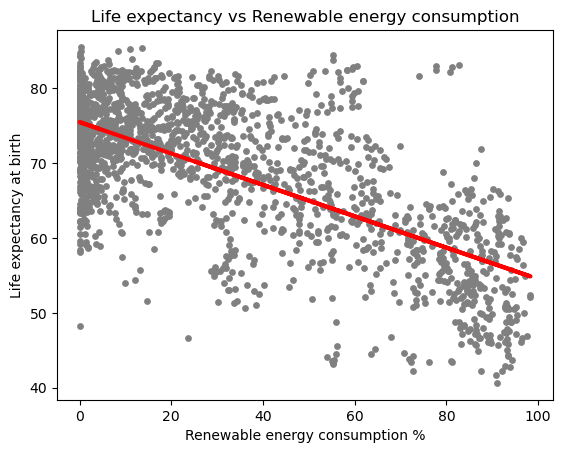

In [127]:
# visualizing the test set results

plot_test = plt
plot_test.scatter(X2t_test, y2t_test, color='gray', s = 15)
plot_test.plot(X2t_test, y2t_pred, color='red', linewidth =3)
plot_test.title('Life expectancy vs Renewable energy consumption')
plot_test.xlabel('Renewable energy consumption %')
plot_test.ylabel('Life expectancy at birth')
plot_test.show()

In [128]:
data = pd.DataFrame({'Actual': y2t_test.flatten(), 'Predicted': y2t_pred.flatten()})
data.head(30)

,Actual,Predicted
0,76.124390,70.102633
1,59.121000,56.366179
2,77.524390,75.341253
3,70.036000,75.024967
4,63.346000,68.489783
5,82.407317,63.234406
6,70.108049,73.058128
7,81.787805,71.719672
8,56.553000,68.837488
9,72.254000,72.310352


#### Discussion for Regression 2:
Removing outliers has not improved the model's fit significantly.